<a href="https://colab.research.google.com/github/ahyar002/Credit-Loan-Project-id-x-partner/blob/main/Credit_Loan_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Konteks
Pada projek kali ini dataset berasal dari lendingclub.com dengan rentang 7 tahun yakni dari tahun 2007-2014. Pemodelan dibuat untuk mempermudah client menentukan pemberian pinjaman kepada customer, yang di analisis melalui parameter "loan status". Jika status yang tersebut berupa "charged off" atau "default" atau delay "31-120 days", hal tersebut merupakan bad loan. Selanjutnya kita akan membuat suatu model prediksi pinjaman. Sehingga,  kita akan bisa memprediksi apakah seseorang  mampu untuk membayar pinjaman/kredit yang telah diberikan

In [1]:
#import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# set untuk menampilkan semua kolom dan baris
pd.options.display.max_columns = None
pd.options.display.max_rows = None

In [4]:
# load dataset csv
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/id x partners credit load project/loan_data_2007_2014.csv')
df.head()

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (20) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
0,0,1077501,1296599,5000,5000,4975.0,36 months,10.65,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0.0,Jan-85,1.0,NaN,NaN,3.0,0.0,13648,83.7,9.0,f,0.0,0.0,5861.071414,5831.78,5000.00,861.07,0.00,0.00,0.00,Jan-15,171.62,NaN,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,1077430,1314167,2500,2500,2500.0,60 months,15.27,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0.0,Apr-99,5.0,NaN,NaN,3.0,0.0,1687,9.4,4.0,f,0.0,0.0,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,1077175,1313524,2400,2400,2400.0,36 months,15.96,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,NaN,small_business,real estate business,606xx,IL,8.72,0.0,Nov-01,2.0,NaN,NaN,2.0,0.0,2956,98.5,10.0,f,0.0,0.0,3003.653644,3003.65,2400.00,603.65,0.00,0.00,0.00,Jun-14,649.91,NaN,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,1076863,1277178,10000,10000,10000.0,36 months,13.49,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0.0,Feb-96,1.0,35.0,NaN,10.0,0.0,5598,21.0,37.0,f,0.0,0.0,12226.302210,12226.30,10000.00,2209.33,16.97,0.00,0.00,Jan-15,357.48,NaN,Jan-15,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,1075358,1311748,3000,3000,3000.0,60 months,12.69,67.79,B,B5,University Medical Group,1 year,RENT,80000.0,Source Verified,Dec-11,Current,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/21/11 > I plan on combi...,other,Personal,972xx,OR,17.94,0.0,Jan-96,0.0,38.0,NaN,15.0,0.0,27783,53.9,38.0,f,766.9,766.9,3242.170000,3242.17,2233.10,1009.07,0.00,0.00,0.00,Jan-16,67.79,Feb-16,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Data Exploration

In [5]:
# melihat info dari data yang dipunya
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 466285 entries, 0 to 466284
Data columns (total 75 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Unnamed: 0                   466285 non-null  int64  
 1   id                           466285 non-null  int64  
 2   member_id                    466285 non-null  int64  
 3   loan_amnt                    466285 non-null  int64  
 4   funded_amnt                  466285 non-null  int64  
 5   funded_amnt_inv              466285 non-null  float64
 6   term                         466285 non-null  object 
 7   int_rate                     466285 non-null  float64
 8   installment                  466285 non-null  float64
 9   grade                        466285 non-null  object 
 10  sub_grade                    466285 non-null  object 
 11  emp_title                    438697 non-null  object 
 12  emp_length                   445277 non-null  object 
 13 

In [6]:
# melihat jumlah kolom dan baris
df.shape

(466285, 75)

In [7]:
# melihat 5 sample pertama
df.head()

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
0,0,1077501,1296599,5000,5000,4975.0,36 months,10.65,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0.0,Jan-85,1.0,NaN,NaN,3.0,0.0,13648,83.7,9.0,f,0.0,0.0,5861.071414,5831.78,5000.00,861.07,0.00,0.00,0.00,Jan-15,171.62,NaN,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,1077430,1314167,2500,2500,2500.0,60 months,15.27,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0.0,Apr-99,5.0,NaN,NaN,3.0,0.0,1687,9.4,4.0,f,0.0,0.0,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,1077175,1313524,2400,2400,2400.0,36 months,15.96,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,NaN,small_business,real estate business,606xx,IL,8.72,0.0,Nov-01,2.0,NaN,NaN,2.0,0.0,2956,98.5,10.0,f,0.0,0.0,3003.653644,3003.65,2400.00,603.65,0.00,0.00,0.00,Jun-14,649.91,NaN,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,1076863,1277178,10000,10000,10000.0,36 months,13.49,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0.0,Feb-96,1.0,35.0,NaN,10.0,0.0,5598,21.0,37.0,f,0.0,0.0,12226.302210,12226.30,10000.00,2209.33,16.97,0.00,0.00,Jan-15,357.48,NaN,Jan-15,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,1075358,1311748,3000,3000,3000.0,60 months,12.69,67.79,B,B5,University Medical Group,1 year,RENT,80000.0,Source Verified,Dec-11,Current,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/21/11 > I plan on combi...,other,Personal,972xx,OR,17.94,0.0,Jan-96,0.0,38.0,NaN,15.0,0.0,27783,53.9,38.0,f,766.9,766.9,3242.170000,3242.17,2233.10,1009.07,0.00,0.00,0.00,Jan-16,67.79,Feb-16,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
# melihat nama-mana kolom
df.columns.values

array(['Unnamed: 0', 'id', 'member_id', 'loan_amnt', 'funded_amnt',
       'funded_amnt_inv', 'term', 'int_rate', 'installment', 'grade',
       'sub_grade', 'emp_title', 'emp_length', 'home_ownership',
       'annual_inc', 'verification_status', 'issue_d', 'loan_status',
       'pymnt_plan', 'url', 'desc', 'purpose', 'title', 'zip_code',
       'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'mths_since_last_delinq',
       'mths_since_last_record', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'initial_list_status', 'out_prncp',
       'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv',
       'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee',
       'recoveries', 'collection_recovery_fee', 'last_pymnt_d',
       'last_pymnt_amnt', 'next_pymnt_d', 'last_credit_pull_d',
       'collections_12_mths_ex_med', 'mths_since_last_major_derog',
       'policy_code', 'application_type', 'annual_inc_joint', 'dti_joint',
       'veri

# Define Target Variable or Labeling
 Agar dapat memebuat suatu model prediksi pinjaman, kita membutuhkan target variabel yang bisa mencerminkan kemampuan individu dalam hal pembayaran pinjaman/kredit.

Dalam dataset ini terdapat variabel loan_status yang mencerminkan peforma individu dalam melakukan pembayaran terhadap pinjaman/kredit. Dengan demikian, variabel loan_status tersebut dijadikan sebagai target variabel.




In [9]:
# menghitung jumlah variabel pada loan status
df['loan_status'].value_counts()

Current                                                224226
Fully Paid                                             184739
Charged Off                                             42475
Late (31-120 days)                                       6900
In Grace Period                                          3146
Does not meet the credit policy. Status:Fully Paid       1988
Late (16-30 days)                                        1218
Default                                                   832
Does not meet the credit policy. Status:Charged Off       761
Name: loan_status, dtype: int64

Dapata dilihat ada beberapan variabel yang mencerminkan individu dalam melakukan pembayaran pinjaman/kredit.

**Current** memiliki  arti pembayaran lancar, **Fully** Paid **teks tebal** berrti pembayaran lunas/full, Charged Off artinya pembayran macet hingga dihapusbukukan, Late berarti pembayaran telat, In Grace Period berarti dalam masa tenggang, Default yang berarti pembayaran macet


berdasarkan definisi tersebut individu dapat digolongkan menjadi good_loan(peminjam yang baik) dan bad_loan (peminjam yang buruk)


Definisi bad dan good loan bisa berbeda-beda tergantung dengan  kebutuhan bisnis. Disini pembayaran lebih dari 16 hari dan yang lebih buruk dari itu digolongkan sebagai bad_loan

In [10]:
df.loan_status.value_counts(normalize=True)*100

Current                                                48.087757
Fully Paid                                             39.619332
Charged Off                                             9.109236
Late (31-120 days)                                      1.479782
In Grace Period                                         0.674695
Does not meet the credit policy. Status:Fully Paid      0.426349
Late (16-30 days)                                       0.261214
Default                                                 0.178432
Does not meet the credit policy. Status:Charged Off     0.163205
Name: loan_status, dtype: float64

In [11]:
bad_loan = ['Charged Off',
            'Late (31-120 days)',
            'Late (16-30 days)', 
            'Default',
            'Does not meet the credit policy. Status:Charged Off' 
]

df['bad_flag'] = np.where(df['loan_status'].isin(bad_loan), 1, 0)

In [12]:
df['bad_flag'].value_counts(normalize=True)*100

0    88.808132
1    11.191868
Name: bad_flag, dtype: float64

Terlihat bahwa  jumlah indivindu yang sudah ditandai sebagai bad_loan lebih sedikit dibanding dengan good_loan. Hal tersebut juga menyebakan adanya prolem imblanced dataset

In [13]:
df.drop('loan_status', axis=1, inplace=True)

# Data Prepocessing

*   kolom dengan jumlah missing value lebih dari 70% di drop
*   sub_grade di drop karena memeiliki informasi yang sama dengan grade
*   kolom yang terkait masa depan tidak dimasukkan ke model karena belum terjadi seperti next_pymnt_d, pemulihan, collection_recovery_fee, total_rec_prncp dan total_rec_late_fee
*   beberapa kolom lainnya yang tidak dimasukkan model antara lain id, member id, url, title, desc, zipcode and emp_title





In [14]:
#Mengecek kolom dengan jumlah missing value lebih dari 70%
missing_value = df.isnull().mean()
missing_value[missing_value > 0.7]

desc                           0.729815
mths_since_last_record         0.865666
mths_since_last_major_derog    0.787739
annual_inc_joint               1.000000
dti_joint                      1.000000
verification_status_joint      1.000000
open_acc_6m                    1.000000
open_il_6m                     1.000000
open_il_12m                    1.000000
open_il_24m                    1.000000
mths_since_rcnt_il             1.000000
total_bal_il                   1.000000
il_util                        1.000000
open_rv_12m                    1.000000
open_rv_24m                    1.000000
max_bal_bc                     1.000000
all_util                       1.000000
inq_fi                         1.000000
total_cu_tl                    1.000000
inq_last_12m                   1.000000
dtype: float64

In [15]:
drop_columns = ['id', 'member_id', 'sub_grade', 'emp_title', 'url', 'desc', 'title', 'zip_code', 'next_pymnt_d',
                  'recoveries', 'collection_recovery_fee', 'total_rec_prncp', 'total_rec_late_fee', 'desc', 'mths_since_last_record',
                  'mths_since_last_major_derog', 'annual_inc_joint', 'dti_joint', 'verification_status_joint', 'open_acc_6m', 'open_il_6m',
                  'open_il_12m', 'open_il_24m', 'mths_since_rcnt_il', 'total_bal_il', 'il_util', 'open_rv_12m', 'open_rv_24m',
                  'max_bal_bc', 'all_util', 'inq_fi', 'total_cu_tl', 'inq_last_12m','policy_code',]
df.drop(columns=drop_columns, inplace=True, axis=1)

df.dropna(inplace=True)


In [16]:
df.head()

,Unnamed: 0,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,emp_length,home_ownership,annual_inc,verification_status,issue_d,pymnt_plan,purpose,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_int,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,application_type,acc_now_delinq,tot_coll_amt,tot_cur_bal,total_rev_hi_lim,bad_flag
42537,42537,12000,12000,12000.0,36 months,6.62,368.45,A,10+ years,MORTGAGE,105000.0,Not Verified,Dec-13,n,debt_consolidation,CT,14.05,0.0,Mar-94,1.0,43.0,12.0,0.0,13168,21.6,22.0,w,4266.62,4266.62,8842.80,8842.80,1109.42,Jan-16,368.45,Jan-16,0.0,INDIVIDUAL,0.0,0.0,267646.0,61100.0,0
42538,42538,12000,12000,12000.0,36 months,13.53,407.40,B,10+ years,RENT,40000.0,Source Verified,Dec-13,n,debt_consolidation,NM,16.94,0.0,Oct-98,0.0,53.0,7.0,2.0,5572,68.8,32.0,w,0.00,0.00,13359.77,13359.77,1359.78,Sep-15,119.17,Jan-16,0.0,INDIVIDUAL,0.0,15386.0,13605.0,8100.0,0
42539,42539,15000,15000,15000.0,36 months,8.90,476.30,A,2 years,MORTGAGE,63000.0,Not Verified,Dec-13,n,debt_consolidation,FL,16.51,0.0,Mar-98,0.0,34.0,8.0,0.0,11431,74.2,29.0,w,5449.27,5449.27,11431.20,11431.20,1880.47,Jan-16,476.30,Jan-16,0.0,INDIVIDUAL,0.0,1514.0,272492.0,15400.0,0
42541,42541,14000,14000,14000.0,36 months,12.85,470.71,B,4 years,RENT,88000.0,Not Verified,Dec-13,n,debt_consolidation,NC,10.02,1.0,Jun-88,0.0,16.0,6.0,1.0,3686,81.9,14.0,f,5274.10,5274.10,11296.94,11296.94,2571.04,Jan-16,470.71,Jan-16,0.0,INDIVIDUAL,0.0,0.0,17672.0,4500.0,0
42543,42543,10000,10000,10000.0,36 months,9.67,321.13,B,7 years,MORTGAGE,102000.0,Not Verified,Dec-13,n,debt_consolidation,MA,15.55,2.0,Oct-89,0.0,11.0,9.0,0.0,9912,44.4,22.0,f,3659.12,3659.12,7706.81,7706.81,1365.93,Jan-16,321.13,Jan-16,0.0,INDIVIDUAL,0.0,0.0,39143.0,22300.0,0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


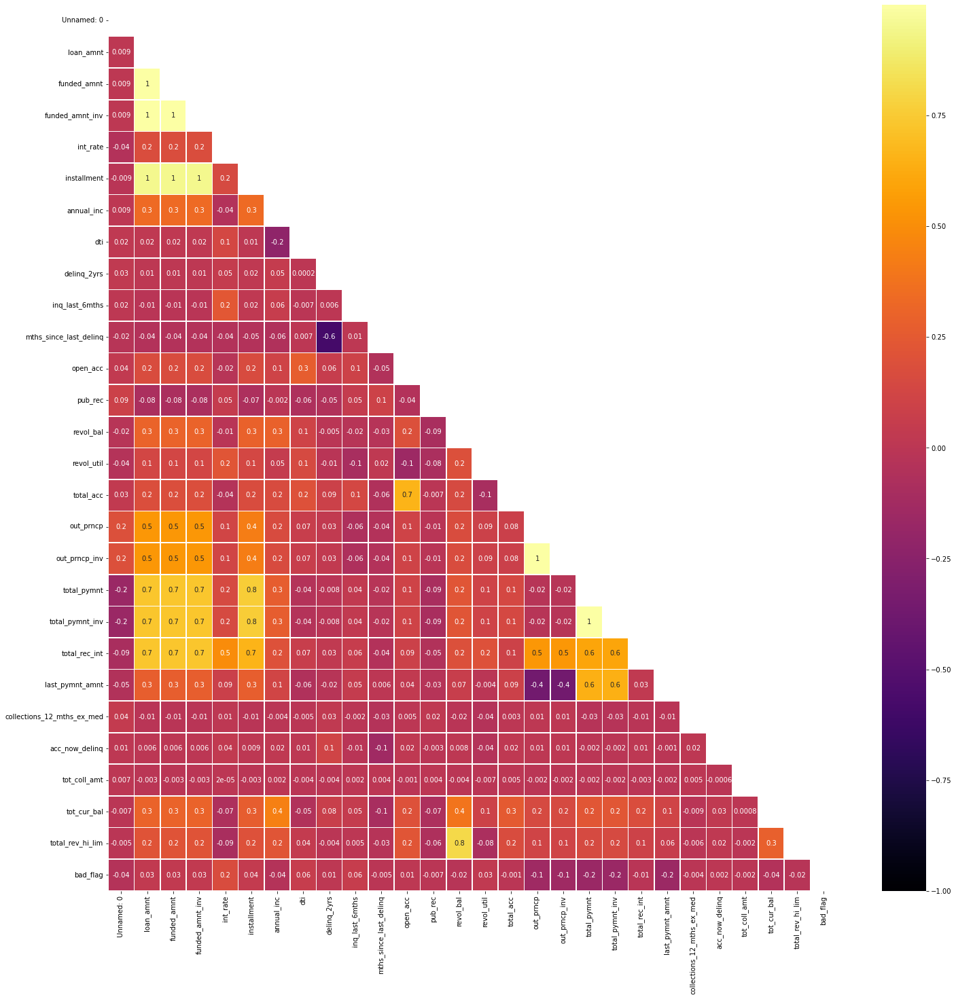

In [17]:
# membuat heatmap korelasi 
mask = np.zeros_like(df.corr().fillna(0), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(24,24))
sns.heatmap(df.corr(), mask=mask, annot=True,  cmap="inferno", vmin = -1, fmt='.1g', edgecolor='w', linewidth=0.6)

In [18]:
 # drop fitur yg multicollinear krn dapat menganggu model
 df.drop(columns=['loan_amnt', 'revol_bal', 'funded_amnt', 'funded_amnt_inv', 'installment',  
                   'total_pymnt_inv',  'out_prncp_inv',  'total_acc'], inplace=True)


# Data Cleaning
Pada bagian ini kita akan membersikan data dengan cara mengganti NaN menjadi nol dan mengganti data type yang tidak sesuai, diantaranya: term, issue_d, emp_leght, last pymnt_d, last_credit_pull_d, earliest_cr_line

In [20]:
df['emp_length'].unique()

array(['10+ years', '2 years', '4 years', '7 years', '6 years', '5 years',
       '8 years', '3 years', '1 year', '< 1 year', '9 years'],
      dtype=object)

In [21]:
df['emp_length_int'] = df['emp_length'].str.replace('\+ years', '')
df['emp_length_int'] = df['emp_length_int'].str.replace('< 1 year', str(0))
df['emp_length_int'] = df['emp_length_int'].str.replace('n/a', str(0))
df['emp_length_int'] = df['emp_length_int'].str.replace(' years', '')
df['emp_length_int'] = df['emp_length_int'].str.replace(' year', '')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.


In [22]:
df['emp_length_int'] = pd.to_numeric(df['emp_length_int'])

In [23]:
# drop kolom emp_length
df.drop('emp_length', axis=1, inplace=True)

In [24]:
def term_num(data, column):
    df[column] = pd.to_numeric(data[column].str.replace('months', ''))

term_num(df,'term')

In [25]:
df['term'].dtype

dtype('int64')

In [26]:
def date_columns(df, column):
    # store current month
    today_date = pd.to_datetime('2020-08-01')
    # convert to datetime format
    df[column] = pd.to_datetime(df[column], format = "%b-%y")
    # calculate the difference in months and add to a new column
    df['mths_since_' + column] = round(pd.to_numeric((today_date - df[column]) / np.timedelta64(1, 'M')))
    # make any resulting -ve values to be equal to the max date
    df['mths_since_' + column] = df['mths_since_' + column].apply(lambda x: df['mths_since_' + column].max() if x < 0 else x)
    # drop the original date column
    df.drop(columns = [column], inplace = True)
    

date_columns(df, 'issue_d')
date_columns(df, 'last_pymnt_d')
date_columns(df, 'last_credit_pull_d')
date_columns(df, 'earliest_cr_line')

In [27]:
# checking for missing values again 

missing_values = df.isnull().sum()
missing_values[missing_values>0]/len(df)

Series([], dtype: float64)

In [28]:
# seperating categorical features from numerical
categorical_features = df.select_dtypes(exclude='number')
numerical_features = df.select_dtypes(exclude='object')

In [29]:
filled_data = df

In [30]:
preprocess_data = df

#checking for any missing values
missing = preprocess_data.isnull().sum()
missing[missing>0]

Series([], dtype: int64)

In [31]:
df.head()

,Unnamed: 0,term,int_rate,grade,home_ownership,annual_inc,verification_status,pymnt_plan,purpose,addr_state,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,open_acc,pub_rec,revol_util,initial_list_status,out_prncp,total_pymnt,total_rec_int,last_pymnt_amnt,collections_12_mths_ex_med,application_type,acc_now_delinq,tot_coll_amt,tot_cur_bal,total_rev_hi_lim,bad_flag,emp_length_int,mths_since_issue_d,mths_since_last_pymnt_d,mths_since_last_credit_pull_d,mths_since_earliest_cr_line
42537,42537,36,6.62,A,MORTGAGE,105000.0,Not Verified,n,debt_consolidation,CT,14.05,0.0,1.0,43.0,12.0,0.0,21.6,w,4266.62,8842.80,1109.42,368.45,0.0,INDIVIDUAL,0.0,0.0,267646.0,61100.0,0,10,80.0,55.0,55.0,317.0
42538,42538,36,13.53,B,RENT,40000.0,Source Verified,n,debt_consolidation,NM,16.94,0.0,0.0,53.0,7.0,2.0,68.8,w,0.00,13359.77,1359.78,119.17,0.0,INDIVIDUAL,0.0,15386.0,13605.0,8100.0,0,10,80.0,59.0,55.0,262.0
42539,42539,36,8.90,A,MORTGAGE,63000.0,Not Verified,n,debt_consolidation,FL,16.51,0.0,0.0,34.0,8.0,0.0,74.2,w,5449.27,11431.20,1880.47,476.30,0.0,INDIVIDUAL,0.0,1514.0,272492.0,15400.0,0,2,80.0,55.0,55.0,269.0
42541,42541,36,12.85,B,RENT,88000.0,Not Verified,n,debt_consolidation,NC,10.02,1.0,0.0,16.0,6.0,1.0,81.9,f,5274.10,11296.94,2571.04,470.71,0.0,INDIVIDUAL,0.0,0.0,17672.0,4500.0,0,4,80.0,55.0,55.0,386.0
42543,42543,36,9.67,B,MORTGAGE,102000.0,Not Verified,n,debt_consolidation,MA,15.55,2.0,0.0,11.0,9.0,0.0,44.4,f,3659.12,7706.81,1365.93,321.13,0.0,INDIVIDUAL,0.0,0.0,39143.0,22300.0,0,7,80.0,55.0,55.0,370.0


Check Categorical Features

In [32]:
df.select_dtypes(include='object').nunique()

grade                   7
home_ownership          6
verification_status     3
pymnt_plan              2
purpose                13
addr_state             47
initial_list_status     2
application_type        1
dtype: int64

pembuangan dilakukan pada fitur yang memiliki nilai satu nilai unik saja dan yang sangat tinggi (high cardinality)

In [33]:
df.drop(['application_type'], axis=1, inplace=True)

In [34]:
# pengecekan pada selain object
df.select_dtypes(exclude='object').nunique()

Unnamed: 0                       181686
term                                  2
int_rate                            145
annual_inc                        12998
dti                                3957
delinq_2yrs                          24
inq_last_6mths                        8
mths_since_last_delinq              142
open_acc                             56
pub_rec                              19
revol_util                         1131
out_prncp                         68052
total_pymnt                      140680
total_rec_int                    127867
last_pymnt_amnt                   84071
collections_12_mths_ex_med            8
acc_now_delinq                        6
tot_coll_amt                       5503
tot_cur_bal                      134730
total_rev_hi_lim                   7043
bad_flag                              2
emp_length_int                       11
mths_since_issue_d                   29
mths_since_last_pymnt_d              41
mths_since_last_credit_pull_d        41


Tidak ada fitur yang memiliki satu nilai unik

In [35]:
for col in df.select_dtypes(include='object').columns.tolist():
  print(df[col].value_counts(normalize=True)*100)
  print('\n')

C    29.210286
B    29.027003
D    18.322270
A    10.974428
E     8.554319
F     3.143335
G     0.768359
Name: grade, dtype: float64


MORTGAGE    54.835816
RENT        36.467862
OWN          8.667151
NONE         0.017062
OTHER        0.011558
ANY          0.000550
Name: home_ownership, dtype: float64


Source Verified    35.253129
Verified           33.445615
Not Verified       31.301256
Name: verification_status, dtype: float64


n    99.998349
y     0.001651
Name: pymnt_plan, dtype: float64


debt_consolidation    61.704809
credit_card           21.383596
home_improvement       6.133109
other                  4.583732
major_purchase         1.646247
small_business         1.129421
medical                0.930176
car                    0.763955
moving                 0.537191
vacation               0.480499
house                  0.423258
wedding                0.226214
renewable_energy       0.057792
Name: purpose, dtype: float64


CA    14.979140
TX     8.227932
NY     8.214172
FL

In [36]:
# fitur yang mendominasi oleh salah satu nilai akan dibuang
df.drop('pymnt_plan', axis=1, inplace=True)

In [37]:
check_missing = df.isnull().sum() * 100 / df.shape[0]
check_missing[check_missing > 0].sort_values(ascending=False)

Series([], dtype: float64)

# Feature Scaling and Transformation
Pada bagian ini kita akan melakukan one hot encoding pada semua kolom kategorikal, selanjutnya dilakukan standarisasi, dan transformasi



One Hot Encoding

In [39]:
# fitur kolom kategorical akan dilakukan one hot encoding

categorical_col = [col for col in df.select_dtypes(include='object').columns.tolist()]

In [40]:
onehot = pd.get_dummies(df[categorical_col], drop_first=True)

In [41]:
onehot.head()

,grade_B,grade_C,grade_D,grade_E,grade_F,grade_G,home_ownership_MORTGAGE,home_ownership_NONE,home_ownership_OTHER,home_ownership_OWN,home_ownership_RENT,verification_status_Source Verified,verification_status_Verified,purpose_credit_card,purpose_debt_consolidation,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding,addr_state_AL,addr_state_AR,addr_state_AZ,addr_state_CA,addr_state_CO,addr_state_CT,addr_state_DC,addr_state_DE,addr_state_FL,addr_state_GA,addr_state_HI,addr_state_IA,addr_state_IL,addr_state_IN,addr_state_KS,addr_state_KY,addr_state_LA,addr_state_MA,addr_state_MD,addr_state_MI,addr_state_MN,addr_state_MO,addr_state_MS,addr_state_MT,addr_state_NC,addr_state_NH,addr_state_NJ,addr_state_NM,addr_state_NV,addr_state_NY,addr_state_OH,addr_state_OK,addr_state_OR,addr_state_PA,addr_state_RI,addr_state_SC,addr_state_SD,addr_state_TN,addr_state_TX,addr_state_UT,addr_state_VA,addr_state_VT,addr_state_WA,addr_state_WI,addr_state_WV,addr_state_WY,initial_list_status_w
42537,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
42538,1,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
42539,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
42541,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
42543,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Standardization

In [42]:
numerical_col = [col for col in df.columns.tolist() if col not in categorical_col + ['bad_flag']]

In [43]:
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()
std = pd.DataFrame(ss.fit_transform(df[numerical_col]), columns=numerical_col)

In [44]:
std.head()

,Unnamed: 0,term,int_rate,annual_inc,dti,delinq_2yrs,inq_last_6mths,mths_since_last_delinq,open_acc,pub_rec,revol_util,out_prncp,total_pymnt,total_rec_int,last_pymnt_amnt,collections_12_mths_ex_med,acc_now_delinq,tot_coll_amt,tot_cur_bal,total_rev_hi_lim,emp_length_int,mths_since_issue_d,mths_since_last_pymnt_d,mths_since_last_credit_pull_d,mths_since_earliest_cr_line
0,-1.761775,-0.634995,-1.841342,0.429924,-0.428892,-0.577696,0.167147,0.427126,0.048746,-0.339376,-1.547541,-0.153866,-0.297086,-0.635748,-0.493157,-0.110131,-0.091393,-0.015126,0.733772,0.795263,1.019002,0.275214,-0.646873,-0.386851,0.391754
1,-1.761767,-0.634995,-0.216324,-0.639416,-0.057771,-0.577696,-0.776876,0.887597,-0.951705,3.247272,0.542515,-0.794419,0.268459,-0.534397,-0.537409,-0.110131,-0.091393,0.697935,-0.858350,-0.453652,1.019002,0.275214,-0.095232,-0.386851,-0.272236
2,-1.761760,-0.634995,-1.305157,-0.261034,-0.112990,-0.577696,-0.776876,0.012701,-0.751615,-0.339376,0.781631,0.023687,0.026993,-0.323610,-0.474012,-0.110131,-0.091393,0.055040,0.764143,-0.281631,-1.198686,0.275214,-0.646873,-0.386851,-0.187729
3,-1.761744,-0.634995,-0.376239,0.150251,-0.946408,0.327726,-0.776876,-0.816148,-1.151795,1.453948,1.122594,-0.002612,0.010183,-0.044052,-0.475004,-0.110131,-0.091393,-0.015126,-0.832862,-0.538484,-0.644264,0.275214,-0.646873,-0.386851,1.224760
4,-1.761728,-0.634995,-1.124077,0.380570,-0.236269,1.233148,-0.776876,-1.046383,-0.551525,-0.339376,-0.537938,-0.245071,-0.439318,-0.531907,-0.501557,-0.110131,-0.091393,-0.015126,-0.698299,-0.119037,0.187369,0.275214,-0.646873,-0.386851,1.031599


Transformed Dataframe

In [45]:
# menggabungkan kembali kolom-kolom hasil transformasi
data_model = pd.concat([onehot, std, df[['bad_flag']]], axis=1)

In [64]:
data_model.replace([np.inf, -np.inf], np.nan, inplace=True)
data_model.fillna(999, inplace=True)


In [65]:
data_model.isna().sum()

grade_B                                0
grade_C                                0
grade_D                                0
grade_E                                0
grade_F                                0
grade_G                                0
home_ownership_MORTGAGE                0
home_ownership_NONE                    0
home_ownership_OTHER                   0
home_ownership_OWN                     0
home_ownership_RENT                    0
verification_status_Source Verified    0
verification_status_Verified           0
purpose_credit_card                    0
purpose_debt_consolidation             0
purpose_home_improvement               0
purpose_house                          0
purpose_major_purchase                 0
purpose_medical                        0
purpose_moving                         0
purpose_other                          0
purpose_renewable_energy               0
purpose_small_business                 0
purpose_vacation                       0
purpose_wedding 

# Creating Model

In [66]:
# import libraries
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import classification_report, confusion_matrix

In [67]:
# mempersiapkan dependent dan independent variabel

x = data_model.drop('bad_flag', axis=1)
y = data_model['bad_flag']
y

0         999.0
1         999.0
2         999.0
3         999.0
4         999.0
5         999.0
6         999.0
7         999.0
8         999.0
9         999.0
10        999.0
11        999.0
12        999.0
13        999.0
14        999.0
15        999.0
16        999.0
17        999.0
18        999.0
19        999.0
20        999.0
21        999.0
22        999.0
23        999.0
24        999.0
25        999.0
26        999.0
27        999.0
28        999.0
29        999.0
30        999.0
31        999.0
32        999.0
33        999.0
34        999.0
35        999.0
36        999.0
37        999.0
38        999.0
39        999.0
40        999.0
41        999.0
42        999.0
43        999.0
44        999.0
45        999.0
46        999.0
47        999.0
48        999.0
49        999.0
50        999.0
51        999.0
52        999.0
53        999.0
54        999.0
55        999.0
56        999.0
57        999.0
58        999.0
59        999.0
60        999.0
61        999.0
62      

In [68]:
# membagi data menjadi train dan test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [69]:
x_train.shape, x_test.shape

((243476, 97), (60870, 97))

Logistic Regression

In [74]:
logr = LogisticRegression(max_iter=10000)
logr.fit(x_train, y_train)
logr_pred = logr.predict(x_test)

In [75]:
confusion_matrix(y_test, logr_pred)

array([[32614,     1,     0],
       [ 3814,     0,     0],
       [    0,     0, 24441]])

In [76]:
print(classification_report(y_test, logr_pred))

              precision    recall  f1-score   support

         0.0       0.90      1.00      0.94     32615
         1.0       0.00      0.00      0.00      3814
       999.0       1.00      1.00      1.00     24441

    accuracy                           0.94     60870
   macro avg       0.63      0.67      0.65     60870
weighted avg       0.88      0.94      0.91     60870



DecisionTree

In [77]:
tree = DecisionTreeClassifier()
tree.fit(x_train, y_train)
tree_pred = tree.predict(x_test)

In [78]:
confusion_matrix(y_test, tree_pred)

array([[30970,  1645,     0],
       [ 3514,   300,     0],
       [    0,     0, 24441]])

In [79]:
print(classification_report(y_test, tree_pred))

              precision    recall  f1-score   support

         0.0       0.90      0.95      0.92     32615
         1.0       0.15      0.08      0.10      3814
       999.0       1.00      1.00      1.00     24441

    accuracy                           0.92     60870
   macro avg       0.68      0.68      0.68     60870
weighted avg       0.89      0.92      0.90     60870



Random Forest Classifier

In [80]:
forest = RandomForestClassifier()
forest.fit(x_train, y_train)
forest_pred = forest.predict(x_test)

In [81]:
confusion_matrix(y_test, forest_pred)

array([[32405,   210,     0],
       [ 3770,    44,     0],
       [    0,     0, 24441]])

In [82]:
print(classification_report(y_test, forest_pred))

              precision    recall  f1-score   support

         0.0       0.90      0.99      0.94     32615
         1.0       0.17      0.01      0.02      3814
       999.0       1.00      1.00      1.00     24441

    accuracy                           0.93     60870
   macro avg       0.69      0.67      0.65     60870
weighted avg       0.89      0.93      0.91     60870



Dari ketiga model machine learning, model logistic regression lah yang memberikan prediksi terbaik dengan akurasi sampai 94%